## 1. Importation et nettoyage des données

In [1]:
import zipfile
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Unzip the file
zip_path = '/content/globalpowerplantdatabasev130 (1).zip'
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall('/content/')

# Find the CSV file inside the unzipped folder (assuming there's one main CSV)
import os
csv_files = [f for f in os.listdir('/content/') if f.endswith('.csv')]
if csv_files:
    data_file = os.path.join('/content/', csv_files[0])
    print(f"Found CSV file: {data_file}")
else:
    print("No CSV file found after unzipping.")
    data_file = None

if data_file:
    # Load the dataset
    df = pd.read_csv(data_file)
    print("\nDataset loaded successfully.")
    # Display the first 5 rows
    display(df.head())
    # Display basic information and data types
    print("\nDataset Info:")
    df.info()

Found CSV file: /content/global_power_plant_database.csv

Dataset loaded successfully.


/tmp/ipykernel_522/901535087.py:24: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(data_file)


,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,estimated_generation_gwh_2013,estimated_generation_gwh_2014,estimated_generation_gwh_2015,estimated_generation_gwh_2016,estimated_generation_gwh_2017,estimated_generation_note_2013,estimated_generation_note_2014,estimated_generation_note_2015,estimated_generation_note_2016,estimated_generation_note_2017
0,AFG,Afghanistan,Kajaki Hydroelectric Power Plant Afghanistan,GEODB0040538,33.0,32.322,65.1190,Hydro,NaN,NaN,...,123.77,162.90,97.39,137.76,119.50,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
1,AFG,Afghanistan,Kandahar DOG,WKS0070144,10.0,31.670,65.7950,Solar,NaN,NaN,...,18.43,17.48,18.25,17.70,18.29,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE
2,AFG,Afghanistan,Kandahar JOL,WKS0071196,10.0,31.623,65.7920,Solar,NaN,NaN,...,18.64,17.58,19.10,17.62,18.72,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE
3,AFG,Afghanistan,Mahipar Hydroelectric Power Plant Afghanistan,GEODB0040541,66.0,34.556,69.4787,Hydro,NaN,NaN,...,225.06,203.55,146.90,230.18,174.91,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
4,AFG,Afghanistan,Naghlu Dam Hydroelectric Power Plant Afghanistan,GEODB0040534,100.0,34.641,69.7170,Hydro,NaN,NaN,...,406.16,357.22,270.99,395.38,350.80,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1



Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34936 entries, 0 to 34935
Data columns (total 36 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   country                         34936 non-null  object 
 1   country_long                    34936 non-null  object 
 2   name                            34936 non-null  object 
 3   gppd_idnr                       34936 non-null  object 
 4   capacity_mw                     34936 non-null  float64
 5   latitude                        34936 non-null  float64
 6   longitude                       34936 non-null  float64
 7   primary_fuel                    34936 non-null  object 
 8   other_fuel1                     1944 non-null   object 
 9   other_fuel2                     276 non-null    object 
 10  other_fuel3                     92 non-null     object 
 11  commissioning_year              17447 non-null  float64
 12  owner            

### 1.1 Identification et gestion des valeurs manquantes

In [2]:
# Calculate the percentage of missing values for each column
missing_values = df.isnull().sum()
missing_percentage = (missing_values / len(df)) * 100

# Create a DataFrame to display missing values
missing_info = pd.DataFrame({
    'Missing Count': missing_values,
    'Missing Percentage': missing_percentage
})

# Filter to show only columns with missing values and sort them
missing_info = missing_info[missing_info['Missing Count'] > 0].sort_values(by='Missing Percentage', ascending=False)

print("\nMissing Values Information:")
display(missing_info)

# Address the DtypeWarning for 'other_fuel3' by converting it to string type
# Since it has a very high percentage of missing values and likely categorical data
df['other_fuel3'] = df['other_fuel3'].astype(str)
print("\n'other_fuel3' column converted to string type to handle mixed types.")

# Re-check info to confirm the change for 'other_fuel3'
print("\nUpdated Dataset Info after handling 'other_fuel3':")
df.info()


Missing Values Information:


,Missing Count,Missing Percentage
other_fuel3,34844,99.736661
other_fuel2,34660,99.209984
other_fuel1,32992,94.435539
generation_gwh_2013,28519,81.632127
generation_gwh_2014,27710,79.316464
generation_gwh_2015,26733,76.519922
generation_gwh_2016,25792,73.826425
generation_gwh_2017,25436,72.807419
generation_gwh_2018,25299,72.415274
generation_gwh_2019,25277,72.352301



'other_fuel3' column converted to string type to handle mixed types.

Updated Dataset Info after handling 'other_fuel3':
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34936 entries, 0 to 34935
Data columns (total 36 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   country                         34936 non-null  object 
 1   country_long                    34936 non-null  object 
 2   name                            34936 non-null  object 
 3   gppd_idnr                       34936 non-null  object 
 4   capacity_mw                     34936 non-null  float64
 5   latitude                        34936 non-null  float64
 6   longitude                       34936 non-null  float64
 7   primary_fuel                    34936 non-null  object 
 8   other_fuel1                     1944 non-null   object 
 9   other_fuel2                     276 non-null    object 
 10  other_fuel3                     

In [3]:
# Handle 'other_fuel' columns
# Fill NaN with 'None' for other_fuel1 and other_fuel2
df['other_fuel1'].fillna('None', inplace=True)
df['other_fuel2'].fillna('None', inplace=True)
# Convert 'nan' string (from previous step's astype(str)) to 'None' for other_fuel3
df['other_fuel3'].replace('nan', 'None', inplace=True)

# Handle other categorical columns with missing values by filling with 'Unknown'
categorical_cols_to_fill = ['owner', 'source', 'url', 'geolocation_source', 'wepp_id', 'generation_data_source']
for col in categorical_cols_to_fill:
    df[col].fillna('Unknown', inplace=True)

# Handle numerical columns: commissioning_year and year_of_capacity_data
# Impute with median for year-related numerical columns
df['commissioning_year'].fillna(df['commissioning_year'].median(), inplace=True)
df['year_of_capacity_data'].fillna(df['year_of_capacity_data'].median(), inplace=True)

# Handle generation_gwh and estimated_generation_gwh columns by filling with 0
generation_cols = [col for col in df.columns if 'generation_gwh' in col]
for col in generation_cols:
    df[col].fillna(0, inplace=True)

print("\nMissing values imputation complete.")

# Re-check missing values after imputation
missing_values_after = df.isnull().sum()
missing_percentage_after = (missing_values_after / len(df)) * 100
missing_info_after = pd.DataFrame({
    'Missing Count': missing_values_after,
    'Missing Percentage': missing_percentage_after
})
missing_info_after = missing_info_after[missing_info_after['Missing Count'] > 0].sort_values(by='Missing Percentage', ascending=False)

print("\nMissing Values Information After Imputation:")
display(missing_info_after)

# Ensure relevant columns are numeric if they were not already
# The generation and capacity columns are already float64, which is suitable.
# commissioning_year and year_of_capacity_data are also float64 after imputation.
# We can convert year columns to integer type if desired, after filling NaNs, as they represent years.
df['commissioning_year'] = df['commissioning_year'].astype(int)
df['year_of_capacity_data'] = df['year_of_capacity_data'].astype(int)

print("\nUpdated Dataset Info after imputation and type conversion:")
df.info()


Missing values imputation complete.

Missing Values Information After Imputation:


/tmp/ipykernel_522/556909213.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['other_fuel1'].fillna('None', inplace=True)
/tmp/ipykernel_522/556909213.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 

,Missing Count,Missing Percentage



Updated Dataset Info after imputation and type conversion:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34936 entries, 0 to 34935
Data columns (total 36 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   country                         34936 non-null  object 
 1   country_long                    34936 non-null  object 
 2   name                            34936 non-null  object 
 3   gppd_idnr                       34936 non-null  object 
 4   capacity_mw                     34936 non-null  float64
 5   latitude                        34936 non-null  float64
 6   longitude                       34936 non-null  float64
 7   primary_fuel                    34936 non-null  object 
 8   other_fuel1                     34936 non-null  object 
 9   other_fuel2                     34936 non-null  object 
 10  other_fuel3                     34936 non-null  object 
 11  commissioning_year              3

## 2. Analyse exploratoire des données

### 2.1 Résumé des statistiques clés des colonnes numériques

In [4]:
# Display key statistics for numerical columns
print("\nKey statistics for numerical columns:")
display(df.describe())


Key statistics for numerical columns:


,capacity_mw,latitude,longitude,commissioning_year,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,estimated_generation_gwh_2013,estimated_generation_gwh_2014,estimated_generation_gwh_2015,estimated_generation_gwh_2016,estimated_generation_gwh_2017
count,34936.000000,34936.000000,34936.000000,34936.000000,34936.000000,34936.000000,34936.000000,34936.000000,34936.000000,34936.000000,34936.000000,34936.000000,34936.000000,34936.000000,34936.000000,34936.000000,34936.000000
mean,163.355148,32.816637,-6.972803,2002.184223,2018.667134,108.865666,135.862677,179.004797,181.422070,179.969788,142.701523,117.204798,110.330003,114.519144,115.110958,118.535774,679.571235
std,489.636072,22.638603,78.405850,17.249214,1.117514,959.867513,1049.093115,1269.384526,1267.279351,1270.071080,1062.866856,912.965076,817.911666,891.961731,892.928446,900.967741,2424.758039
min,1.000000,-77.847000,-179.977700,1896.000000,2000.000000,-947.600000,-989.619000,-864.428000,-768.620000,-934.944000,-982.622000,-780.339000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.900000,29.256475,-77.641550,2007.000000,2019.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.820000
50%,16.745000,39.727750,-2.127100,2007.000000,2019.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.330000,32.475000
75%,75.344250,46.263125,49.502675,2007.000000,2019.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.114250,21.592500,23.492500,24.720000,28.040000,195.640000
max,22500.000000,71.292000,179.388700,2020.000000,2019.000000,50834.000000,32320.917000,37433.607000,32377.477000,36448.643000,35136.000000,31920.368000,48675.060000,58470.770000,57113.350000,60859.730000,82810.770000


### 2.2 Exploration de la répartition des centrales électriques par pays et type de combustible

#### Répartition par pays


Top 10 Countries by Number of Power Plants:


,count
country_long,
United States of America,9833
China,4235
United Kingdom,2751
Brazil,2360
France,2155
India,1589
Germany,1309
Canada,1159
Spain,829


/tmp/ipykernel_522/2406319182.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=country_distribution.head(10).index, y=country_distribution.head(10).values, palette='viridis')


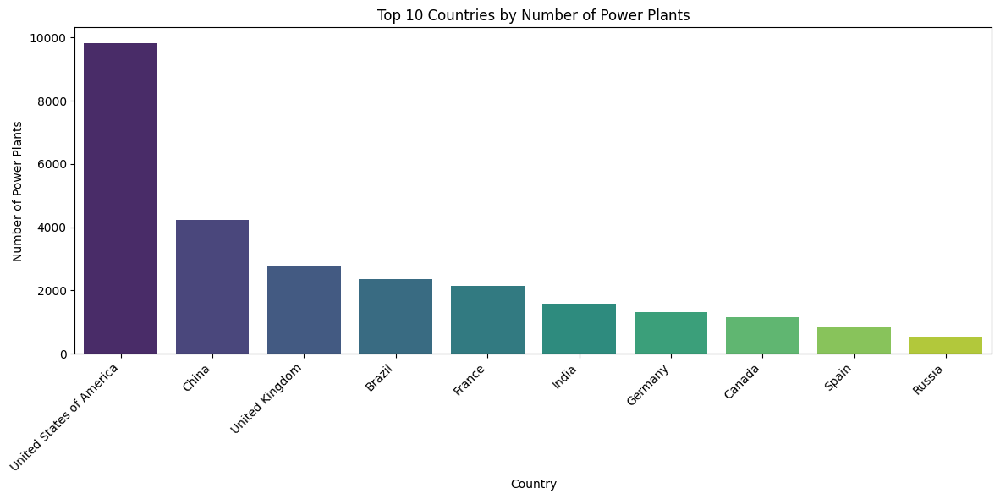

In [5]:
# Explore distribution by country
country_distribution = df['country_long'].value_counts()
print("\nTop 10 Countries by Number of Power Plants:")
display(country_distribution.head(10))

# Visualize the top N countries
plt.figure(figsize=(12, 6))
sns.barplot(x=country_distribution.head(10).index, y=country_distribution.head(10).values, palette='viridis')
plt.title('Top 10 Countries by Number of Power Plants')
plt.xlabel('Country')
plt.ylabel('Number of Power Plants')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

#### Répartition par type de combustible principal


Primary Fuel Type Distribution:


,count
primary_fuel,
Solar,10665
Hydro,7156
Wind,5344
Gas,3998
Coal,2330
Oil,2320
Biomass,1430
Waste,1068
Nuclear,195


/tmp/ipykernel_522/1086660316.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=fuel_distribution.index, y=fuel_distribution.values, palette='plasma')


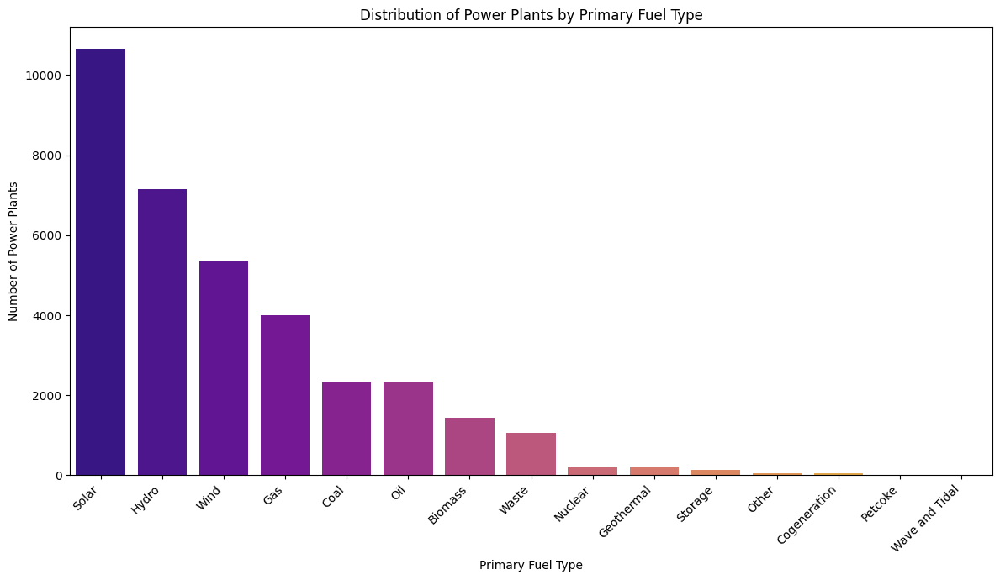

In [6]:
# Explore distribution by primary fuel type
fuel_distribution = df['primary_fuel'].value_counts()
print("\nPrimary Fuel Type Distribution:")
display(fuel_distribution)

# Visualize the primary fuel type distribution
plt.figure(figsize=(12, 7))
sns.barplot(x=fuel_distribution.index, y=fuel_distribution.values, palette='plasma')
plt.title('Distribution of Power Plants by Primary Fuel Type')
plt.xlabel('Primary Fuel Type')
plt.ylabel('Number of Power Plants')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

## 3. Analyse statistique

### 3.1 Analyse statistique de la puissance de sortie par type de carburant

In [7]:
# Perform statistical analysis of capacity_mw by primary_fuel
# Using Pandas' groupby and aggregate functions, which internally leverage NumPy for calculations
fuel_capacity_stats = df.groupby('primary_fuel')['capacity_mw'].agg(
    Mean=np.mean,
    Median=np.median,
    Standard_Deviation=np.std
).sort_values(by='Mean', ascending=False)

print("\nStatistical Analysis of Power Output (capacity_mw) by Primary Fuel Type:")
display(fuel_capacity_stats)


Statistical Analysis of Power Output (capacity_mw) by Primary Fuel Type:


/tmp/ipykernel_522/4158630878.py:3: FutureWarning: The provided callable <function mean at 0x7b4410bca3e0> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  fuel_capacity_stats = df.groupby('primary_fuel')['capacity_mw'].agg(
/tmp/ipykernel_522/4158630878.py:3: FutureWarning: The provided callable <function median at 0x7b44105b2700> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
  fuel_capacity_stats = df.groupby('primary_fuel')['capacity_mw'].agg(
/tmp/ipykernel_522/4158630878.py:3: FutureWarning: The provided callable <function std at 0x7b4410bca520> is currently using SeriesGroupBy.std. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "std" instead.
  fuel_capacity_st

,Mean,Median,Standard_Deviation
primary_fuel,,,
Nuclear,2091.855179,1888.00000,1303.509273
Coal,843.579828,600.00000,888.187187
Gas,373.449375,147.50000,560.934146
Petcoke,202.048125,65.48875,476.986459
Hydro,147.171551,20.00000,549.809328
Oil,112.878754,9.00000,392.009039
Cogeneration,98.731707,31.90000,283.428252
Other,84.020000,40.00000,145.891392
Geothermal,67.130952,30.00000,114.640890


### 3.2 Tests d'hypothèses pour la puissance moyenne de sortie par type de carburant

In [8]:
from scipy import stats

# Prepare data for ANOVA: Extract capacity_mw for each primary fuel type
fuel_types = df['primary_fuel'].unique()
capacity_by_fuel = []
for fuel in fuel_types:
    # Filter out empty groups or groups with very few data points if necessary
    # For simplicity, we will include all, but in a real scenario, consider minimum group size
    group_data = df[df['primary_fuel'] == fuel]['capacity_mw']
    if len(group_data) > 1:
        capacity_by_fuel.append(group_data)

# Perform one-way ANOVA test
# We convert to NumPy arrays for direct use with scipy.stats.f_oneway
# Ensure all arrays are not empty
capacity_by_fuel_np = [np.array(arr) for arr in capacity_by_fuel if len(arr) > 0]

if len(capacity_by_fuel_np) > 1: # ANOVA requires at least 2 groups
    f_statistic, p_value = stats.f_oneway(*capacity_by_fuel_np)

    print("\nHypothesis Testing: ANOVA for Average Power Output by Fuel Type")
    print(f"F-statistic: {f_statistic:.2f}")
    print(f"P-value: {p_value:.3e}") # Display p-value in scientific notation for very small values

    # Interpret the result
    alpha = 0.05
    if p_value < alpha:
        print(f"Since the p-value ({p_value:.3e}) is less than the significance level (alpha={alpha}), we reject the null hypothesis.")
        print("Conclusion: There is a statistically significant difference in the average power output between at least two different primary fuel types.")
        print("Further post-hoc tests (e.g., Tukey's HSD) would be needed to identify which specific fuel types differ.")
    else:
        print(f"Since the p-value ({p_value:.3e}) is greater than the significance level (alpha={alpha}), we fail to reject the null hypothesis.")
        print("Conclusion: There is no statistically significant difference in the average power output between different primary fuel types.")
else:
    print("Not enough distinct primary fuel types with sufficient data to perform ANOVA.")


Hypothesis Testing: ANOVA for Average Power Output by Fuel Type
F-statistic: 967.46
P-value: 0.000e+00
Since the p-value (0.000e+00) is less than the significance level (alpha=0.05), we reject the null hypothesis.
Conclusion: There is a statistically significant difference in the average power output between at least two different primary fuel types.
Further post-hoc tests (e.g., Tukey's HSD) would be needed to identify which specific fuel types differ.


## 4. Analyse des séries chronologiques

### 4.1 Évolution de la composition des types de combustibles au fil des ans


Evolution of Power Plant Commissioning by Primary Fuel Over the Years (Top 5 fuels):


primary_fuel,Biomass,Coal,Cogeneration,Gas,Geothermal,Hydro,Nuclear,Oil,Other,Petcoke,Solar,Storage,Waste,Wave and Tidal,Wind
commissioning_year,,,,,,,,,,,,,,,
2016,8,84,1,45,0,45,0,38,0,0,464,11,15,0,169
2017,3,46,0,48,2,22,0,5,1,0,523,19,8,0,105
2018,3,14,0,52,2,4,0,7,1,0,480,10,4,0,40
2019,2,0,1,34,2,1,0,3,0,0,458,32,3,0,63
2020,1,0,0,6,0,0,0,0,0,0,122,2,2,0,17


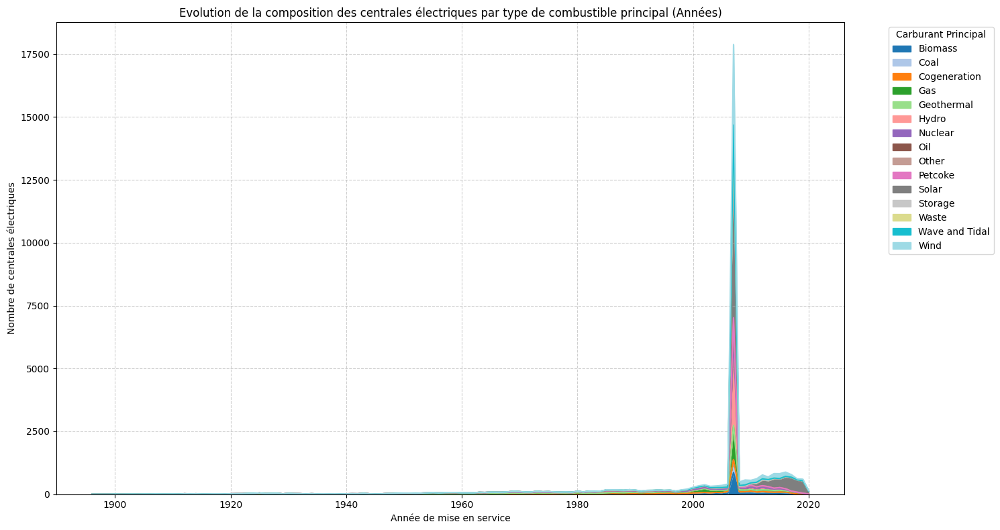

In [9]:
# Analyze trends over time: number of plants by primary fuel over the years
# Exclude commissioning year 0 or extreme values if they exist due to imputation or errors
# Assuming commissioning_year 2007 was used as median, let's consider years before present

year_fuel_composition = df[df['commissioning_year'] <= 2023].groupby(['commissioning_year', 'primary_fuel']).size().unstack(fill_value=0)

print("\nEvolution of Power Plant Commissioning by Primary Fuel Over the Years (Top 5 fuels):")
display(year_fuel_composition.tail())

# Visualize the evolution of fuel types over time
plt.figure(figsize=(15, 8))
year_fuel_composition.plot(kind='area', stacked=True, colormap='tab20', ax=plt.gca())
plt.title('Evolution de la composition des centrales électriques par type de combustible principal (Années)')
plt.xlabel('Année de mise en service')
plt.ylabel('Nombre de centrales électriques')
plt.legend(title='Carburant Principal', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


Evolution of Power Plant Capacity (MW) by Primary Fuel Over the Years (Top 5 fuels):


primary_fuel,Biomass,Coal,Cogeneration,Gas,Geothermal,Hydro,Nuclear,Oil,Other,Petcoke,Solar,Storage,Waste,Wave and Tidal,Wind
commissioning_year,,,,,,,,,,,,,,,
2016,441.896,67685.7,9.5,17903.1,0.0,16654.67294,0.0,10410.9416,0.0,0.0,7546.3,95.1,131.067,0.0,10881.6
2017,69.200,29173.0,0.0,7992.3,58.2,4784.19000,0.0,29.0000,10.0,0.0,6912.4,151.5,86.600,0.0,10019.6
2018,3.000,12918.0,0.0,15117.6,50.7,452.00000,0.0,645.0000,50.4,0.0,5393.8,83.9,50.700,0.0,4756.9
2019,2.000,0.0,58.2,7558.2,100.0,1.20000,0.0,26.2000,0.0,0.0,4838.9,228.7,4.700,0.0,10893.1
2020,2.800,0.0,0.0,1271.4,0.0,0.00000,0.0,0.0000,0.0,0.0,2055.1,12.0,116.000,0.0,2238.7


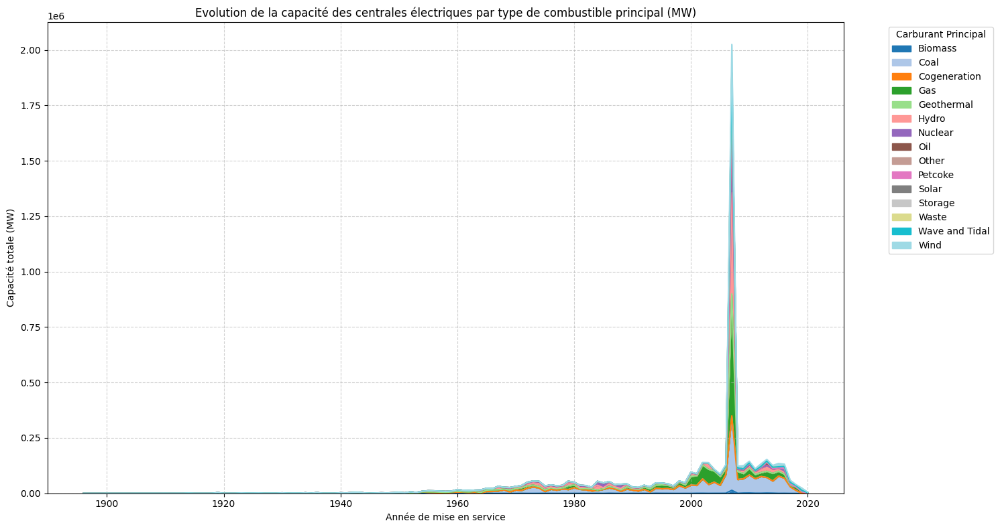

In [10]:
# Also analyze trends over time: total capacity (MW) by primary fuel over the years
capacity_year_fuel_composition = df[df['commissioning_year'] <= 2023].groupby(['commissioning_year', 'primary_fuel'])['capacity_mw'].sum().unstack(fill_value=0)

print("\nEvolution of Power Plant Capacity (MW) by Primary Fuel Over the Years (Top 5 fuels):")
display(capacity_year_fuel_composition.tail())

# Visualize the evolution of capacity by fuel types over time
plt.figure(figsize=(15, 8))
capacity_year_fuel_composition.plot(kind='area', stacked=True, colormap='tab20', ax=plt.gca())
plt.title('Evolution de la capacité des centrales électriques par type de combustible principal (MW)')
plt.xlabel('Année de mise en service')
plt.ylabel('Capacité totale (MW)')
plt.legend(title='Carburant Principal', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

## 5. Visualisation avancée

### 5.1 Représentation graphique de la répartition géographique des centrales électriques

In [11]:
plt.figure(figsize=(15, 10))
sns.scatterplot(
    data=df,
    x='longitude',
    y='latitude',
    hue='primary_fuel',
    palette='tab20',
    size='capacity_mw', # Size of points based on capacity
    sizes=(20, 400),    # Range of marker sizes
    alpha=0.6,
    legend='full'
)

plt.title('Répartition géographique des centrales électriques par type de carburant principal et capacité')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(title='Carburant Principal', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

/tmp/ipykernel_522/4112123542.py:19: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


## 6. Opérations matricielles en contexte réel

### 6.1 Analyse des relations entre les différents attributs


Matrice de corrélation des attributs numériques clés:


,capacity_mw,latitude,longitude,generation_gwh_2019
capacity_mw,1.000000,-0.013218,0.151525,0.301830
latitude,-0.013218,1.000000,-0.068354,0.024514
longitude,0.151525,-0.068354,1.000000,-0.138902
generation_gwh_2019,0.301830,0.024514,-0.138902,1.000000


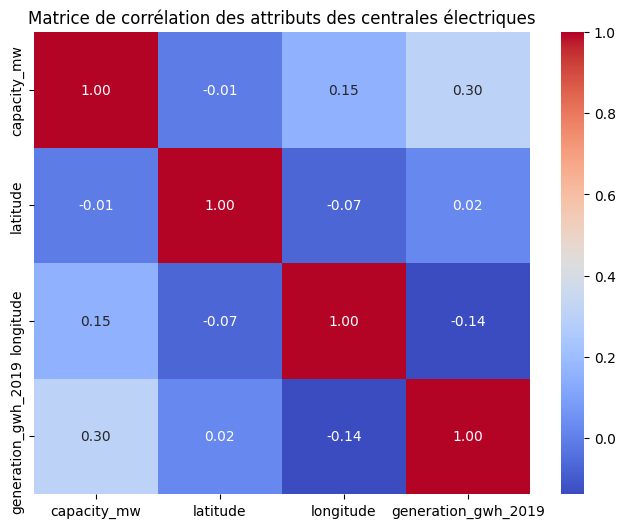

In [12]:
# Select relevant numerical attributes for correlation analysis
# Exclude year columns as they were already used for time series, focus on physical attributes and initial generation
numerical_attributes = df[['capacity_mw', 'latitude', 'longitude', 'generation_gwh_2019']].copy()

# Calculate the correlation matrix using NumPy internally (Pandas .corr() method uses NumPy)
correlation_matrix = numerical_attributes.corr()

print("\nMatrice de corrélation des attributs numériques clés:")
display(correlation_matrix)

# Visualize the correlation matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matrice de corrélation des attributs des centrales électriques')
plt.show()

### 6.2 Pertinence des vecteurs propres et des valeurs propres dans ce contexte

Les **valeurs propres** (eigenvalues) et les **vecteurs propres** (eigenvectors) sont des concepts fondamentaux en algèbre linéaire qui trouvent de nombreuses applications en analyse de données, notamment dans l'analyse en composantes principales (ACP).

Dans le contexte de notre analyse de la matrice de corrélation:

*   **Analyse en Composantes Principales (ACP)** : Si nous effectuions une ACP sur nos attributs numériques (comme `capacity_mw`, `latitude`, `longitude`, `generation_gwh_2019`), les vecteurs propres de la matrice de covariance (ou de corrélation, après standardisation) correspondraient aux directions des composantes principales. Les valeurs propres associées indiqueraient la quantité de variance expliquée par chaque composante principale.

*   **Réduction de dimensionnalité** : En identifiant les composantes principales qui expliquent la plus grande partie de la variance des données (celles avec les plus grandes valeurs propres), nous pourrions réduire la dimensionnalité de notre ensemble de données tout en conservant la majeure partie de l'information. Cela est utile pour visualiser les données ou pour entraîner des modèles plus efficaces.

*   **Détection de redondance/multicolinéarité** : De très petites valeurs propres pourraient indiquer une forte redondance ou multicolinéarité entre certaines variables, où plusieurs variables mesurent des aspects très similaires.

Pour ce jeu de données spécifique, l'ACP pourrait révéler si la capacité, la latitude, la longitude et la production annuelle sont des attributs indépendants ou s'ils sont liés de manière complexe, ce qui pourrait simplifier l'interprétation des principaux facteurs influençant les centrales électriques. Par exemple, si la capacité et la production sont fortement corrélées, elles pourraient être représentées efficacement par une seule composante principale.

## 7. Intégration de NumPy avec Pandas et Matplotlib

### 7.1 Utilisation de tableaux NumPy pour un filtrage complexe dans Pandas

In [13]:
# Utilisation de NumPy pour créer un masque de filtrage complexe dans Pandas
# Supposons que nous voulions trouver des centrales électriques à forte capacité (> median) et une latitude positive (hémisphère nord)

median_capacity = np.median(df['capacity_mw'])

# Créer un masque booléen NumPy pour les conditions
condition_high_capacity = df['capacity_mw'] > median_capacity
condition_northern_hemisphere = df['latitude'] > 0

# Combiner les conditions à l'aide d'opérations logiques NumPy
complex_filter_mask = np.logical_and(condition_high_capacity, condition_northern_hemisphere)

# Appliquer le masque pour filtrer le DataFrame Pandas
filtered_plants = df[complex_filter_mask]

print(f"\nNombre total de centrales: {len(df)}")
print(f"Capacité médiane: {median_capacity:.2f} MW")
print(f"Nombre de centrales à haute capacité dans l'hémisphère nord: {len(filtered_plants)}")
display(filtered_plants.head())


Nombre total de centrales: 34936
Capacité médiane: 16.74 MW
Nombre de centrales à haute capacité dans l'hémisphère nord: 15404


,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,estimated_generation_gwh_2013,estimated_generation_gwh_2014,estimated_generation_gwh_2015,estimated_generation_gwh_2016,estimated_generation_gwh_2017,estimated_generation_note_2013,estimated_generation_note_2014,estimated_generation_note_2015,estimated_generation_note_2016,estimated_generation_note_2017
0,AFG,Afghanistan,Kajaki Hydroelectric Power Plant Afghanistan,GEODB0040538,33.0,32.3220,65.1190,Hydro,None,None,...,123.77,162.90,97.39,137.76,119.50,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
3,AFG,Afghanistan,Mahipar Hydroelectric Power Plant Afghanistan,GEODB0040541,66.0,34.5560,69.4787,Hydro,None,None,...,225.06,203.55,146.90,230.18,174.91,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
4,AFG,Afghanistan,Naghlu Dam Hydroelectric Power Plant Afghanistan,GEODB0040534,100.0,34.6410,69.7170,Hydro,None,None,...,406.16,357.22,270.99,395.38,350.80,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
6,AFG,Afghanistan,Northwest Kabul Power Plant Afghanistan,GEODB0040540,42.0,34.5638,69.1134,Gas,None,None,...,0.00,0.00,0.00,0.00,0.00,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION
8,AFG,Afghanistan,Sarobi Dam Hydroelectric Power Plant Afghanistan,GEODB0040535,22.0,34.5865,69.7757,Hydro,None,None,...,123.23,82.87,69.15,93.83,80.00,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1


### 7.2 Utilisation de NumPy pour la création de graphiques sophistiqués dans Matplotlib

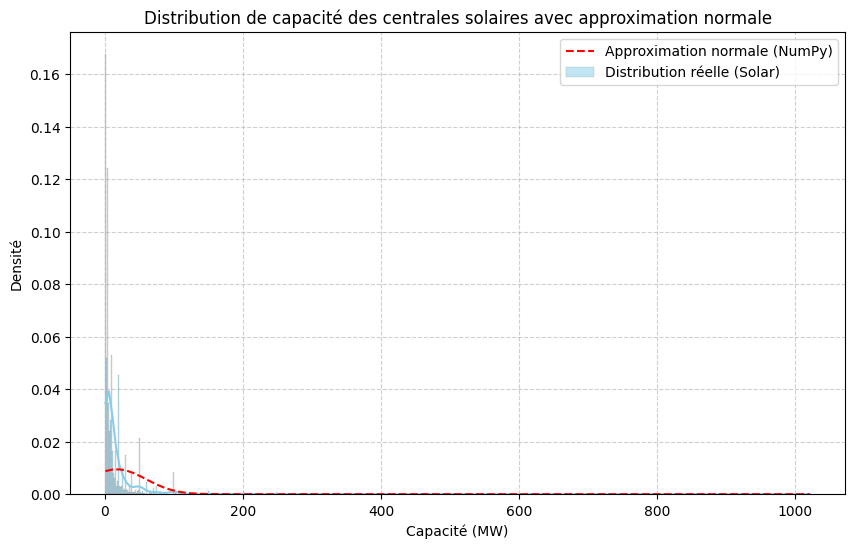

In [14]:
# Créer des données synthétiques avec NumPy pour une visualisation Matplotlib avancée
# Nous allons simuler une distribution de capacité pour un type de carburant spécifique

# Exemple: Visualisation de la distribution de capacité pour le "Solar" avec une courbe de densité (KDE)
# et une approximation de la distribution normale (créée avec NumPy)

solar_capacity = df[df['primary_fuel'] == 'Solar']['capacity_mw'].dropna()

# Utiliser NumPy pour calculer la moyenne et l'écart type pour une distribution normale
mean_solar_capacity = np.mean(solar_capacity)
std_solar_capacity = np.std(solar_capacity)

# Créer des points pour la courbe de distribution normale avec NumPy
x = np.linspace(solar_capacity.min(), solar_capacity.max(), 100)
y = (1 / (np.sqrt(2 * np.pi) * std_solar_capacity)) * np.exp(-0.5 * ((x - mean_solar_capacity) / std_solar_capacity)**2)

plt.figure(figsize=(10, 6))
sns.histplot(solar_capacity, kde=True, stat='density', color='skyblue', label='Distribution réelle (Solar)')
plt.plot(x, y, color='red', linestyle='--', label='Approximation normale (NumPy)')
plt.title('Distribution de capacité des centrales solaires avec approximation normale')
plt.xlabel('Capacité (MW)')
plt.ylabel('Densité')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()